In [216]:
import pandas as pd
import string
import ast
import numpy as np
from sklearn.model_selection import train_test_split

In [217]:
df = pd.read_csv(r"dataset\data\readyds\newds.csv")

In [218]:
df.isna().sum()

text               0
class              0
id                 0
class list         0
class length       0
emotion            0
clean text        90
emotion vector     0
dtype: int64

In [219]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54262 entries, 0 to 54261
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   text            54262 non-null  object
 1   class           54262 non-null  object
 2   id              54262 non-null  object
 3   class list      54262 non-null  object
 4   class length    54262 non-null  int64 
 5   emotion         54262 non-null  object
 6   clean text      54172 non-null  object
 7   emotion vector  54262 non-null  object
dtypes: int64(1), object(7)
memory usage: 3.3+ MB


In [220]:
df = df.dropna(subset=['clean text'])

In [221]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 54172 entries, 0 to 54261
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   text            54172 non-null  object
 1   class           54172 non-null  object
 2   id              54172 non-null  object
 3   class list      54172 non-null  object
 4   class length    54172 non-null  int64 
 5   emotion         54172 non-null  object
 6   clean text      54172 non-null  object
 7   emotion vector  54172 non-null  object
dtypes: int64(1), object(7)
memory usage: 3.7+ MB


## Type Conversion

In [222]:
df['text'] = df['text'].astype('string')
df['id'] = df['id'].astype('string')
df['clean text'] = df['clean text'].astype('string')

In [223]:
def fix_val(x):
    if isinstance(x, str):
        return ast.literal_eval(x)
    else:
        return x

In [224]:
df['class list'] = df['class list'].apply(fix_val)
df['emotion'] = df['emotion'].apply(fix_val)
df['emotion vector'] = df['emotion vector'].apply(fix_val)

In [225]:
df['emotion vector array'] = df['emotion vector'].apply(lambda x: np.array(x, dtype=np.float32))

In [226]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 54172 entries, 0 to 54261
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   text                  54172 non-null  string
 1   class                 54172 non-null  object
 2   id                    54172 non-null  string
 3   class list            54172 non-null  object
 4   class length          54172 non-null  int64 
 5   emotion               54172 non-null  object
 6   clean text            54172 non-null  string
 7   emotion vector        54172 non-null  object
 8   emotion vector array  54172 non-null  object
dtypes: int64(1), object(5), string(3)
memory usage: 4.1+ MB


## Stratify Sampling for Train/Valid/Test

In [227]:
train_df, temp_df = train_test_split(df, test_size=0.2, stratify=df['class length'], random_state=42)
valid_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['class length'], random_state=42)

In [228]:
train_df.shape

(43337, 9)

In [229]:
valid_df.shape

(5417, 9)

In [230]:
test_df.shape

(5418, 9)

In [231]:
train_df.head(15)

,text,class,id,class list,class length,emotion,clean text,emotion vector,emotion vector array
52745,100%. Please ignore him. He's annoying af and ...,3,edd0t0r,[3],1,[annoyance],100 please ignore he annoying af survives atte...,"[0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
29678,"Of all the people in the world, I honestly can...",26,ef6b87x,[26],1,[surprise],people world honestly cant believe reddit hate...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
12446,"I’m from Oklahoma City. Not a small city, but ...","4,27",eehh6l0,"[4, 27]",2,"[approval, neutral]",i’m oklahoma city not small city patient,"[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, ..."
52659,[NAME] doesn’t roll his ankle on a 🎾 in 2011 a...,27,ef6ij1d,[27],1,[neutral],name doesn’t roll ankle 2011 win premiership imo,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
26457,"I get my tax money back every year, no complai...","0,27",edtr2ur,"[0, 27]",2,"[admiration, neutral]",get tax money back every year no complaint plu...,"[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
5709,Oh do the thing where you flick food into my m...,27,eetbl4a,[27],1,[neutral],oh thing flick food mouth,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3291,Watch the ignorance of a variety of topics man...,3,eel49oe,[3],1,[annoyance],watch ignorance variety topic manifest word di...,"[0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
11530,"I don't like it, simply because men never want...","3,10",ednm4yb,"[3, 10]",2,"[annoyance, disapproval]",dont like simply men never want friend no inte...,"[0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, ...","[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
15632,Shame Saints aren't even going to get a LBP ou...,12,ede75rk,[12],1,[embarrassment],shame saint arent even going get lbp game feel...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
26273,Some say [NAME] is still trapped to this day i...,27,edut9ol,[27],1,[neutral],say name still trapped day ab,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


In [232]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43337 entries, 52745 to 1183
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   text                  43337 non-null  string
 1   class                 43337 non-null  object
 2   id                    43337 non-null  string
 3   class list            43337 non-null  object
 4   class length          43337 non-null  int64 
 5   emotion               43337 non-null  object
 6   clean text            43337 non-null  string
 7   emotion vector        43337 non-null  object
 8   emotion vector array  43337 non-null  object
dtypes: int64(1), object(5), string(3)
memory usage: 3.3+ MB


In [233]:
with open(r'dataset\data\emotions.txt', 'r') as f:
    emo_list = f.read().splitlines()

## DistilBERT Fine Tuning

In [234]:
import numpy as np
import tensorflow as tf
from sklearn.utils.class_weight import compute_class_weight
from transformers import DistilBertTokenizer, TFDistilBertModel
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling1D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import f1_score, precision_score, recall_score, hamming_loss, accuracy_score

In [235]:
all_labels = [label for sublist in train_df['class list'] for label in sublist]
unique_classes = np.unique(all_labels)
class_weights = compute_class_weight(class_weight='balanced',
                                     classes=unique_classes,
                                     y=all_labels)

In [236]:
class_weights_dict = {cls: weight for cls, weight in zip(unique_classes, class_weights)}

In [237]:
full_class_weights_dict = {i: class_weights_dict.get(i, 1.0) for i in range(len(emo_list))}

In [238]:
tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")
MAX_LEN = 128

In [239]:
def tokenize_data(texts):
    return tokenizer(list(texts), max_length=MAX_LEN, padding='max_length', truncation=True, return_tensors="tf")

In [240]:
train_tokens = tokenize_data(train_df['clean text'])
val_tokens = tokenize_data(valid_df['clean text'])

In [241]:
bert_model = TFDistilBertModel.from_pretrained("distilbert-base-uncased")

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFDistilBertModel: ['vocab_layer_norm.weight', 'vocab_layer_norm.bias', 'vocab_projector.bias', 'vocab_transform.weight', 'vocab_transform.bias']
- This IS expected if you are initializing TFDistilBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFDistilBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertModel for predictions without further training.


In [242]:
input_ids = Input(shape=(MAX_LEN,), dtype=tf.int32, name="input_ids")
attention_mask = Input(shape=(MAX_LEN,), dtype=tf.int32, name="attention_mask")

In [243]:
bert_output = bert_model(input_ids, attention_mask=attention_mask)[0]
x = GlobalAveragePooling1D()(bert_output)
x = Dense(128, activation='relu')(x)
output = Dense(len(emo_list), activation='sigmoid')(x)

In [244]:
model = Model(inputs=[input_ids, attention_mask], outputs=output)

In [245]:
model.compile(
    optimizer=Adam(learning_rate=3e-5),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

In [246]:
early_stop = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=1, verbose=1)

In [247]:
model.fit(
    x={
        "input_ids": train_tokens['input_ids'],
        "attention_mask": train_tokens['attention_mask']
    },
    y=np.array(train_df['emotion vector'].tolist()),
    validation_data=(
        {
            "input_ids": val_tokens['input_ids'],
            "attention_mask": val_tokens['attention_mask']
        },
        np.array(valid_df['emotion vector'].tolist())
    ),
    epochs=10,
    batch_size=32,
    callbacks=[early_stop, lr_scheduler],
    class_weight=full_class_weights_dict 
)

Epoch 1/10
1355/1355 [==============================] - 626s 454ms/step - loss: 0.1146 - accuracy: 0.4819 - val_loss: 0.0979 - val_accuracy: 0.5355 - lr: 3.0000e-05
Epoch 2/10
1355/1355 [==============================] - 610s 450ms/step - loss: 0.0900 - accuracy: 0.5620 - val_loss: 0.0931 - val_accuracy: 0.5437 - lr: 3.0000e-05
Epoch 3/10
1355/1355 [==============================] - ETA: 0s - loss: 0.0792 - accuracy: 0.6070  
Epoch 3: ReduceLROnPlateau reducing learning rate to 1.4999999621068127e-05.
1355/1355 [==============================] - 610s 450ms/step - loss: 0.0792 - accuracy: 0.6070 - val_loss: 0.0967 - val_accuracy: 0.5195 - lr: 3.0000e-05
Epoch 4/10
1355/1355 [==============================] - ETA: 0s - loss: 0.0624 - accuracy: 0.6892   
Epoch 4: ReduceLROnPlateau reducing learning rate to 7.499999810534064e-06.
1355/1355 [==============================] - 610s 450ms/step - loss: 0.0624 - accuracy: 0.6892 - val_loss: 0.1006 - val_accuracy: 0.5263 - lr: 1.5000e-05


In [248]:
model.save(r"models\bert.keras")  

## Lstm model

In [249]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Bidirectional, LSTM, Dropout, Dense

In [250]:
VOCAB_SIZE = 10000
EMBED_DIM = 128
BATCH_SIZE = 32
EPOCHS = 10

In [251]:
tokenizer_lstm = Tokenizer(num_words=VOCAB_SIZE, oov_token='<OOV>')
tokenizer_lstm.fit_on_texts(train_df['clean text'])

In [252]:
train_seq = tokenizer_lstm.texts_to_sequences(train_df['clean text'])
val_seq = tokenizer_lstm.texts_to_sequences(valid_df['clean text'])

In [253]:
train_pad = pad_sequences(train_seq, maxlen=MAX_LEN, padding='post', truncating='post')
val_pad = pad_sequences(val_seq, maxlen=MAX_LEN, padding='post', truncating='post')

In [254]:
train_labels = np.array(train_df['emotion vector'].tolist())
val_labels = np.array(valid_df['emotion vector'].tolist())

In [255]:
def focal_loss(gamma=2., alpha=0.25):
    def loss_fn(y_true, y_pred):
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1 - 1e-7)
        pt = tf.where(tf.equal(y_true, 1), y_pred, 1 - y_pred)
        return -tf.reduce_mean(alpha * tf.pow(1. - pt, gamma) * tf.math.log(pt))
    return loss_fn

In [256]:
model_lstm = Sequential([
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBED_DIM, input_length=MAX_LEN),
    Bidirectional(LSTM(64)),
    Dropout(0.3),
    Dense(64, activation='relu'),
    Dense(train_labels.shape[1], activation='sigmoid') 
])

In [257]:
early_stop = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=1, verbose=1)

In [258]:
model_lstm.compile(
    optimizer=Adam(learning_rate=1e-3), 
    loss=focal_loss(gamma=2., alpha=0.25), 
    metrics=['accuracy'] 
)

In [259]:
early_stop = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=1, verbose=1)

In [260]:
history = model_lstm.fit(
    train_pad,
    train_labels,
    validation_data=(val_pad, val_labels),
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=[early_stop, lr_scheduler]
)

Epoch 1/10
1355/1355 [==============================] - 31s 20ms/step - loss: 0.0093 - accuracy: 0.4094 - val_loss: 0.0075 - val_accuracy: 0.4942 - lr: 0.0010
Epoch 2/10
1355/1355 [==============================] - 25s 19ms/step - loss: 0.0069 - accuracy: 0.5263 - val_loss: 0.0071 - val_accuracy: 0.5174 - lr: 0.0010
Epoch 3/10
1354/1355 [============================>.] - ETA: 0s - loss: 0.0061 - accuracy: 0.5688 
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
1355/1355 [==============================] - 25s 19ms/step - loss: 0.0061 - accuracy: 0.5688 - val_loss: 0.0072 - val_accuracy: 0.5173 - lr: 0.0010
Epoch 4/10
1354/1355 [============================>.] - ETA: 0s - loss: 0.0053 - accuracy: 0.6184 
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
1355/1355 [==============================] - 25s 19ms/step - loss: 0.0053 - accuracy: 0.6184 - val_loss: 0.0075 - val_accuracy: 0.5008 - lr: 5.0000e-04


In [261]:
model_lstm.save("models/lstm.keras")

## BERT Evaluation

In [262]:
test_df

,text,class,id,class list,class length,emotion,clean text,emotion vector,emotion vector array
13482,Nice find!,0,ef4c8qd,[0],1,[admiration],nice find,"[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
29265,I like picking beans with grandma.,18,eeglcvl,[18],1,[love],like picking bean grandma,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
45103,"As someone named [NAME], I welcome him to Dall...",17,efbgv4m,[17],1,[joy],someone named name welcome dallas gang,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
48448,Ah thanks. I was posting on mobile so sub rule...,15,ed6tkvs,[15],1,[gratitude],ah thanks posting mobile sub rule aren’t obvious,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
43785,This is my favorite meme that happened every year,13,ee7c5qj,[13],1,[excitement],favorite meme happened every year,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
...,...,...,...,...,...,...,...,...,...
25378,Invite him over to play! A game on the switch....,27,eety4ha,[27],1,[neutral],invite play game switchcause well lifestyle co...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
6895,You’re joking right?,27,edy2nl7,[27],1,[neutral],you’re joking right,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
25806,Gotta love an environmentally friendly coachin...,18,ee1u8tk,[18],1,[love],gotta love environmentally friendly coaching s...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
35290,Was really hoping he’d drive off with it (sigh),8,edb8uqe,[8],1,[desire],really hoping he’d drive sigh,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ..."


In [263]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import f1_score, precision_score, recall_score, hamming_loss, accuracy_score, classification_report, confusion_matrix,precision_recall_curve

In [264]:
test_tokens = tokenize_data(test_df['clean text'])
y_test_true = np.array(test_df['emotion vector array'].tolist())

In [265]:
bert_probs = model.predict({
    "input_ids": test_tokens['input_ids'],
    "attention_mask": test_tokens['attention_mask']
})

170/170 [==============================] - 27s 149ms/step


In [266]:
thresholds_bert = []
for i in range(len(emo_list)):
    precision, recall, thresh = precision_recall_curve(y_test_true[:, i], bert_probs[:, i])
    f1 = 2 * (precision * recall) / (precision + recall + 1e-6)
    best_thresh = thresh[np.argmax(f1)] if len(thresh) > 0 else 0.5
    thresholds_bert.append(best_thresh)

In [267]:
bert_pred = np.zeros_like(bert_probs, dtype=int)
for i, t in enumerate(thresholds):
    bert_pred[:, i] = (bert_probs[:, i] > t).astype(int)

In [268]:
print("DISTILBERT MULTI-LABEL CLASSIFICATION REPORT:")
print(classification_report(y_test_true, bert_pred, target_names=emo_list, zero_division=0))


DISTILBERT MULTI-LABEL CLASSIFICATION REPORT:
                precision    recall  f1-score   support

    admiration       0.75      0.58      0.66       502
     amusement       0.73      0.86      0.79       296
         anger       0.69      0.32      0.44       212
     annoyance       0.50      0.16      0.24       322
      approval       0.59      0.14      0.23       359
        caring       0.47      0.24      0.32       148
     confusion       0.57      0.23      0.33       181
     curiosity       0.43      0.09      0.15       264
        desire       0.52      0.29      0.37        77
disappointment       0.38      0.21      0.27       147
   disapproval       0.40      0.21      0.27       263
       disgust       0.63      0.31      0.42       102
 embarrassment       0.86      0.43      0.57        28
    excitement       0.50      0.20      0.28       101
          fear       0.54      0.66      0.60        74
     gratitude       0.93      0.87      0.90       329
 

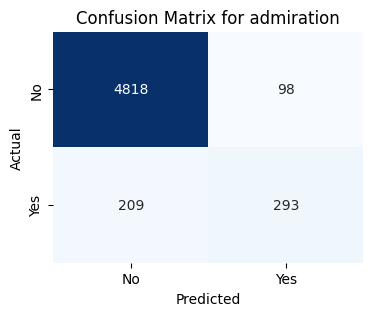

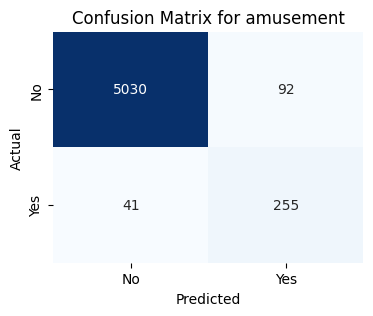

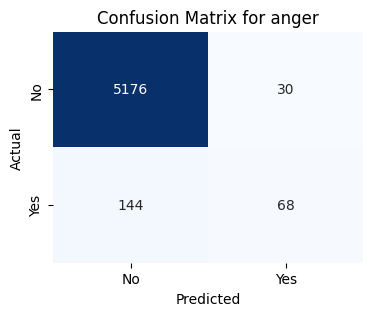

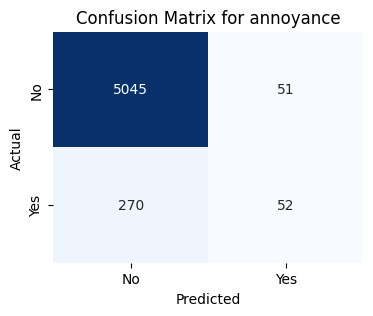

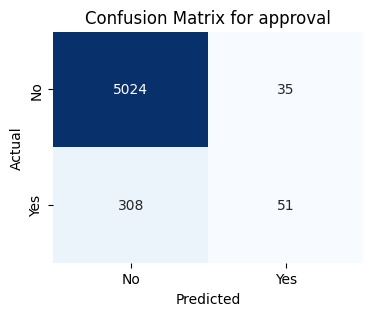

...

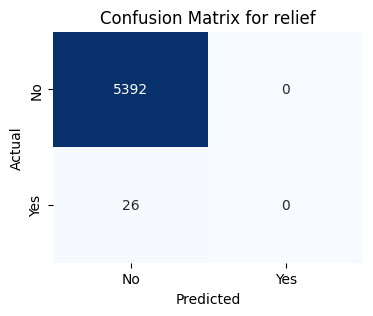

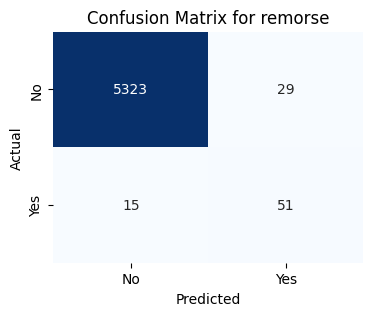

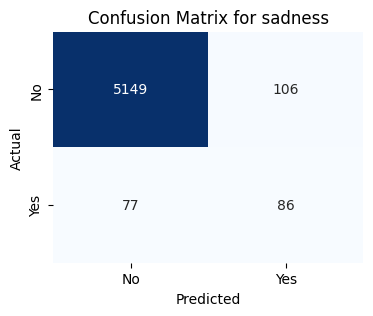

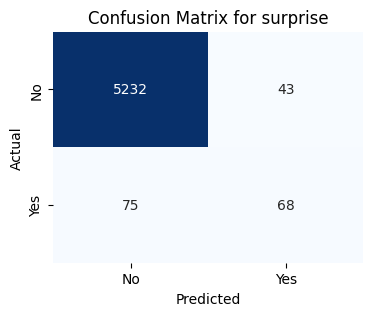

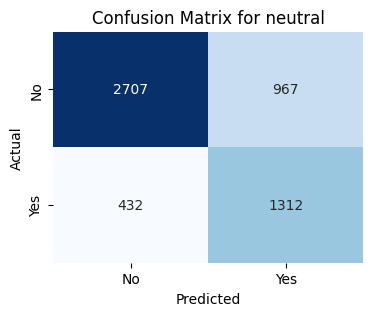

In [269]:
for i, emotion in enumerate(emo_list):
    cm = confusion_matrix(y_test_true[:, i], bert_pred[:, i])
    
    plt.figure(figsize=(4, 3))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title(f'Confusion Matrix for {emotion}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.xticks([0.5, 1.5], ['No', 'Yes'])
    plt.yticks([0.5, 1.5], ['No', 'Yes'])
    plt.show()

In [270]:
thresholds_bert = np.array(thresholds_bert)
np.save("models/thresholds/thresholds_bert.npy", thresholds_bert)

## LSTM Evaluation

In [271]:
test_seq = tokenizer_lstm.texts_to_sequences(test_df['clean text'])
test_pad = pad_sequences(test_seq, maxlen=MAX_LEN, padding='post', truncating='post')

In [272]:
lstm_probs = model_lstm.predict(test_pad)

170/170 [==============================] - 2s 7ms/step


In [273]:
thresholds = []
for i in range(len(emo_list)):
    precision, recall, thresh = precision_recall_curve(y_test_true[:, i], lstm_probs[:, i])
    f1 = 2 * (precision * recall) / (precision + recall + 1e-6)
    best_thresh = thresh[np.argmax(f1)] if len(thresh) > 0 else 0.5
    thresholds.append(best_thresh)

In [274]:
lstm_pred = np.zeros_like(lstm_probs, dtype=int)
for i, t in enumerate(thresholds):
    lstm_pred[:, i] = (lstm_probs[:, i] > t).astype(int)

In [275]:
print("LSTM MULTI-LABEL CLASSIFICATION REPORT:")
print(classification_report(y_test_true, lstm_pred, target_names=emo_list, zero_division=0))

LSTM MULTI-LABEL CLASSIFICATION REPORT:
                precision    recall  f1-score   support

    admiration       0.64      0.61      0.63       502
     amusement       0.73      0.79      0.76       296
         anger       0.39      0.54      0.45       212
     annoyance       0.27      0.45      0.34       322
      approval       0.28      0.33      0.30       359
        caring       0.26      0.39      0.31       148
     confusion       0.22      0.24      0.23       181
     curiosity       0.16      0.34      0.22       264
        desire       0.38      0.39      0.38        77
disappointment       0.14      0.33      0.20       147
   disapproval       0.24      0.41      0.30       263
       disgust       0.52      0.45      0.48       102
 embarrassment       1.00      0.21      0.35        28
    excitement       0.30      0.25      0.27       101
          fear       0.51      0.62      0.56        74
     gratitude       0.95      0.87      0.91       329
       

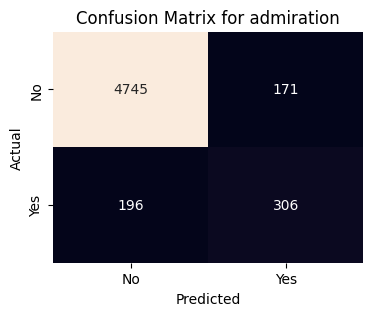

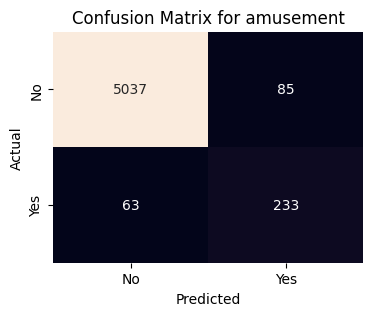

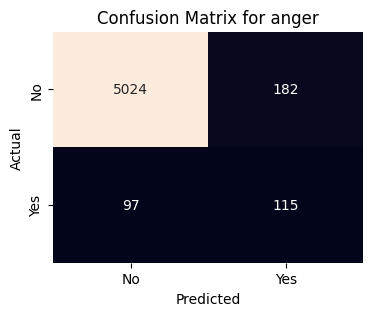

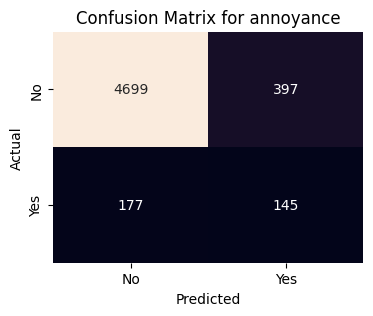

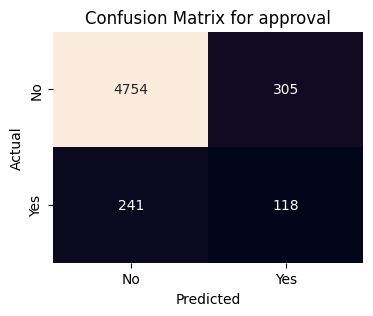

...

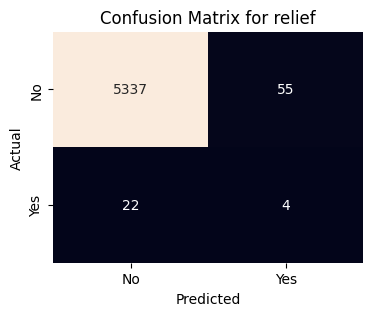

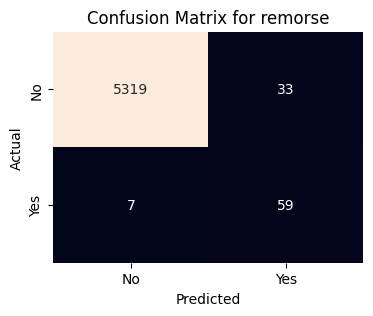

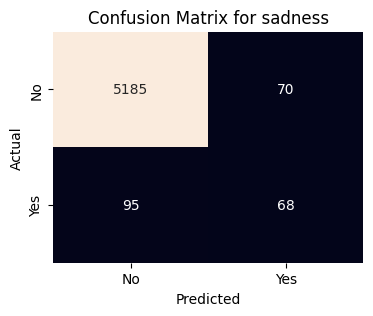

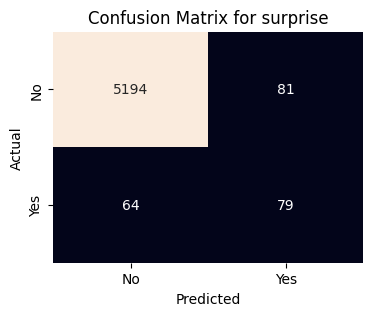

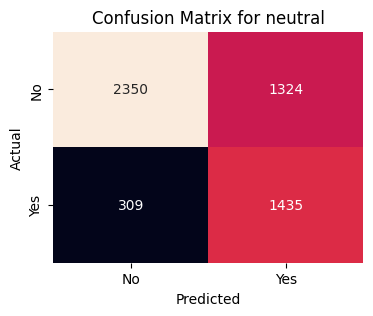

In [276]:
for i, emotion in enumerate(emo_list):
    cm = confusion_matrix(y_test_true[:, i], lstm_pred[:, i])
    plt.figure(figsize=(4, 3))
    sns.heatmap(cm, annot=True, fmt='d', cbar=False)
    plt.title(f'Confusion Matrix for {emotion}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.xticks([0.5, 1.5], ['No', 'Yes'])
    plt.yticks([0.5, 1.5], ['No', 'Yes'])
    plt.show()

In [277]:
thresholds = np.array(thresholds)

In [278]:
np.save("models/thresholds/thresholds_lstm.npy", thresholds)

## LIME Samples

In [279]:
from lime.lime_text import LimeTextExplainer

In [280]:
explainer = LimeTextExplainer(class_names=emo_list)

In [281]:
def predict_bert(texts):
    encodings = tokenizer(texts, max_length=MAX_LEN, padding='max_length', truncation=True, return_tensors="tf")
    preds = model.predict({"input_ids": encodings['input_ids'], "attention_mask": encodings['attention_mask']})
    return preds

In [291]:
for i in range(2, 8):
    exp = explainer.explain_instance(
        test_df['clean text'].iloc[i],
        predict_bert,
        num_features=10,
        top_labels=3
    )
    exp.show_in_notebook()

157/157 [==============================] - 23s 148ms/step


157/157 [==============================] - 22s 140ms/step


157/157 [==============================] - 22s 140ms/step


157/157 [==============================] - 22s 140ms/step


157/157 [==============================] - 22s 140ms/step


157/157 [==============================] - 22s 140ms/step


In [292]:
import pickle

In [293]:
with open("models/token/lstm_tokenizer.pkl", "wb") as f:
    pickle.dump(tokenizer_lstm, f)

In [294]:
tokenizer.save_pretrained("models/token/bert_tokenizer")

('models/token/bert_tokenizer\\tokenizer_config.json',
 'models/token/bert_tokenizer\\special_tokens_map.json',
 'models/token/bert_tokenizer\\vocab.txt',
 'models/token/bert_tokenizer\\added_tokens.json')